 # `Image`&nbsp;模块

 这个&nbsp;`Image`&nbsp;模块提供了一个同名的类，用于表示PIL图像。该模块还提供许多工厂功能，包括从文件加载图像和创建新图像的功能。

 ## 实例

 ### 打开、旋转和显示图像（使用默认查看器）

 下面的脚本加载图像，将其旋转45度，并使用外部查看器（通常是UNIX上的xv，以及Windows上的paintins)

In [ ]:
from PIL import Image
im = Image.open("cl2.jpg")
im.rotate(45)


 ### 创建缩略图

 下面的脚本创建当前目录中所有JPEG图像的漂亮缩略图，保留最大分辨率为128x128的纵横比。

In [ ]:
from PIL import Image
import glob, os

size = 128, 128

for infile in glob.glob("*.jpg"):
    file, ext = os.path.splitext(infile)
    im = Image.open(infile)
    im.thumbnail(size)
    im.save(file + "_thumbnail.png", "PNG")


 ## 功能

 `PIL.Imagopen`(_fp_,&nbsp;_mode='r)

 打开并标识给定的图像文件。

这是一个懒惰的操作；此函数标识文件，但文件保持打开状态，并且在尝试处理数据（或调用&nbsp;`load()`&nbsp;方法）。见&nbsp;`new()`&nbsp;. 见&nbsp;Pillow中的文件处理&nbsp;.

 * 参数
   *  **fp**&nbsp;-- 文件名（字符串）、pathlib.path对象或文件对象。文件对象必须实现&nbsp;`read()`&nbsp;，&nbsp;`seek()`&nbsp;和&nbsp;`tell()`&nbsp;方法，并以二
   *  **mode**&nbsp;-- 模式。如果给出，这个参数必须是“*
 * 返回
   *  一个&nbsp;`Image`&nb* 象。
 * 引发
   *  **FileNotFoundError**&nb  找不到文件。
   *  **PIL.UnidentifiedImageError**&nbsp;  开和识别图像。
   *  **ValueError**&nbsp;-- 如果&nbsp;`mode`&nbsp;不是“r”，或者如果&nbsp;`StringIO`&nbsp;实例用于&nbsp

 * 警告

以防止由“引起的潜在DoS攻击”&nbsp;decompression bombs" (i.e. malicious files which decompress into a huge amount of data and are designed to crash or cause disruption by using up a lot of memory), Pillow will issue a&nbsp;`DecompressionBombWarning`&nbsp;if the image is over a certain limit. If desired, the warning can be turned into an error with&nbsp;`warnings.simplefilter('error', Image.DecompressionBombWarning)`&nbsp;or suppressed entirely with&nbsp;`warnings.simplefilter('ignore', Image.DecompressionBombWarning)`. See also&nbsp;the logging documentation&nbsp;将通过使用常量alpha在两个输入图像之间插入来创建新图像。


 ### 图像处理

 `PIL.Image.alpha_composite`(_im1_,&nbsp;_im2_)

 IM1上的α复合IM2。

 * 参数
   *  **im1**&nbsp;-- 第一张图片。必须具有模式rgba。
   *  **im2**&nbsp;-- 第二张图片。必须具有模式rgba，并且大小与第一个图像相同。

 * 返回
   *  一个&nbsp;`Image`&nbsp;对象。


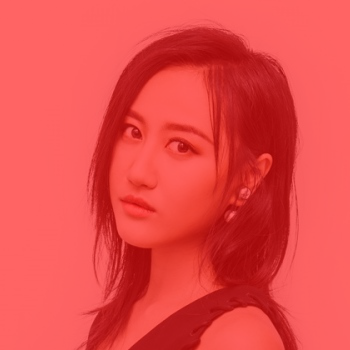

In [87]:

im1 = Image.open('cl.jpg')
im1 = im1.convert('RGBA')
r, g, b, alpha = im1.split()
alpha = alpha.point(lambda i: i>0 and 100)
im1.putalpha(alpha)
im2 = Image.new("RGBA", im1.size, "#FF0000")
im3 = Image.alpha_composite(im2, im1) # 能看到 im2 的黑色背景
im3

In [159]:
im1 = Image.open('cl1.jpg')
im1 = im1.convert('RGBA')
_ , a , _ , _ = im1.split()
alpha = a.point(lambda i: i>4 and 126)
im1.putalpha(alpha)
im2 = Image.new("RGBA", im1.size, "#FF0000")
im3 = Image.alpha_composite(im2, im1) 

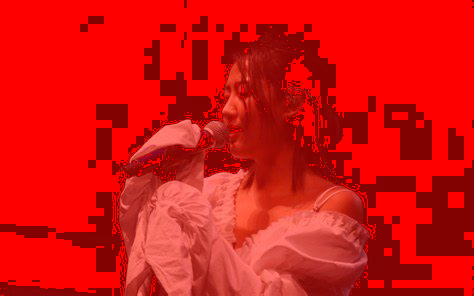

In [160]:
im3

 `PIL.Image.blend`(_im1_,&nbsp;_im2_,&nbsp;_alpha_)

 通过使用常量alpha在两个输入图像之间插入来创建新图像。：
 ```
 out = image1 * (1.0 - alpha) + image2 * alpha
 ```
 * 参数
   *  **im1**&nbsp;-- 第一张图片。
   *  **im2**&nbsp;-- 第二张图片。必须与第一个图像具有相同的模式和大小。
   *  **alpha**&nbsp;-- 插值α因子。如果alpha为0.0，则返回第一个图像的副本。如果alpha为1.0，则返回第二个图像的副本。alpha值没有限制。如有必要，将结果裁剪到允许的输出范围内。

 * 返回
   *  一个&nbsp;`Image`&nbsp;对象。



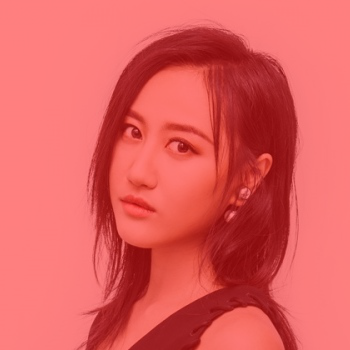

In [171]:
im1 = Image.open('cl.jpg')
im2 = Image.new("RGB", im1.size, "red")
im3 = Image.blend(im1,im2,0.5)
im3

 `PIL.Image.composite`(_image1_,&nbsp;_image2_,&nbsp;_mask_)
 通过使用透明蒙版混合图像来创建合成图像。

 * 参数
   *  **image1**&nbsp;-- 第一张图片。
   *  **image2**&nbsp;-- 第二张图片。必须与第一个图像具有相同的模式和大小。
   *  **mask**&nbsp;-- 掩模图像。此图像可以具有模式“1”、“l”或“rgba”，并且必须与其他两个图像具有相同的大小。



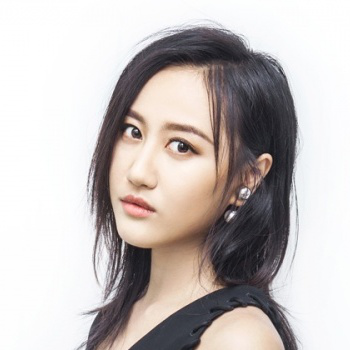

In [173]:
im1 = Image.open('cl.jpg')
im2=Image.new("RGB",im1.size,"blue")
im3=Image.new("RGBA",im1.size,"black")
im4=Image.composite(im1,im2,im3)
im4

 `PIL.Image.eval`(_image_,&nbsp;_*args_)
 对给定图像中的每个像素应用函数（应采用一个参数）。如果图像有多个波段，则对每个波段应用相同的功能。请注意，该函数对每个可能的像素值进行一次评估，因此不能使用随机组件或其他生成器。

 * 参数
   *  **image**&nbsp;-- 输入图像。
   *  **function**&nbsp;-- 一个函数对象，采用一个整型参数。

 * 返回
   *  一个&nbsp;`Image`&nbsp;对象。



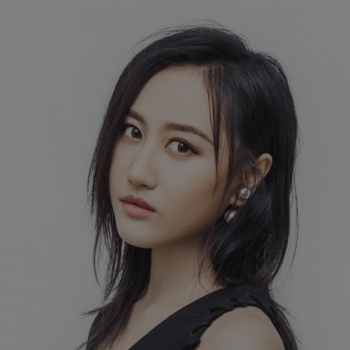

In [174]:
Image.eval(im1,lambda x:x*0.5)

 `PIL.Image.merge`(_mode_,&nbsp;_bands_)
 将一组单波段图像合并为新的多波段图像。

 * 参数
   *  **mode**&nbsp;-- 用于输出图像的模式。见：&nbsp;模式&nbsp;.
   *  **bands**&nbsp;-- 包含输出图像中每个波段一个单波段图像的序列。所有带区的大小必须相同。

 * 返回
   *  一个&nbsp;`Image`&nbsp;对象。



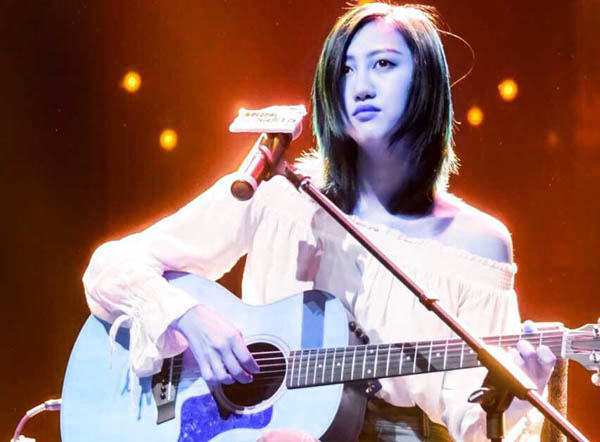

In [175]:
im = Image.open("cl2.jpg")
r, g, b = im.split()
Image.merge("RGB", (b, g, r))

 ### 构建图像

 `PIL.Image.new`(_mode_,&nbsp;_size_,&nbsp;_color=0_)
 创建具有给定模式和大小的新图像。

 * 参数
   *  **mode**&nbsp;-- 用于新图像的模式。见：&nbsp;模式&nbsp;.
   *  **size**&nbsp;-- 以像素为单位包含（宽度、高度）的2元组。
   *  **color**&nbsp;-- 图像要使用什么颜色。默认为黑色。如果给定，对于单波段模式，这应该是一个整数或浮点值，对于多波段模式，这应该是一个元组（每个波段一个值）。创建RGB图像时，还可以使用ImageColor模块支持的颜色字符串。如果颜色为“无”，则图像不会初始化。

 * 返回
   *  一个&nbsp;`Image`&nbsp;对象。



 `PIL.Image.fromarray`(_obj_,&nbsp;_mode=None_)
 从导出数组接口的对象（使用缓冲区协议）创建图像内存。

 如果&nbsp;**obj**&nbsp;不是连续的，则调用tobytes方法并&nbsp;`frombuffer()`&nbsp;使用。

 如果你有一张NumPy的图片：

In [176]:
from PIL import Image
import numpy as np
im = Image.open('cl.jpg')
a = np.asarray(im)


 然后可以将其转换为Pillow图像：

In [178]:
ima = Image.fromarray(a)


 * 参数
   *  **obj**&nbsp;-- 带数组接口的对象
   *  **mode**&nbsp;-- 要使用的模式（如果没有将由类型决定）请参见：&nbsp;模式&nbsp;.
 * 返回
   *  一个&nbsp;`Image`&nbsp;对象。


 1.1.6 新版功能.

 `PIL.Image.frombytes`(_mode_,&nbsp;_size_,&nbsp;_data_,&nbsp;_decoder_name='raw'_,&nbsp;_*args_)

 从缓冲区中的像素数据创建图像内存的副本。

 最简单的形式是，这个函数接受三个参数（模式、大小和未压缩的像素数据）。

 您还可以使用PIL支持的任何像素解码器。有关可用解码器的详细信息，请参阅部分&nbsp;Writing Your Own File Decoder&nbsp;.

 请注意，此函数只解码像素数据，而不是整个图像。如果在字符串中包含整个图像，请将其包装为&nbsp;`BytesIO`&nbsp;对象与使用&nbsp;`open()`&nbsp;加载它。

 * 参数
   *  **mode**&nbsp;-- 图像模式。见：&nbsp;模式&nbsp;.
   *  **size**&nbsp;-- 图像大小。
   *  **data**&nbsp;-- 包含给定模式的原始数据的字节缓冲区。
   *  **decoder_name**&nbsp;-- 使用什么解码器。
   *  **args**&nbsp;-- 给定解码器的其他参数。

 * 返回
   *  一个&nbsp;`Image`&nbsp;对象。

`PIL.Image.fromstring`(_*args_,&nbsp;_**kw_)

`PIL.Image.frombuffer`(_mode_,&nbsp;_size_,&nbsp;_data_,&nbsp;_decoder_name='raw'_,&nbsp;_*args_)

 在字节缓冲区中创建引用像素数据的图像内存。

 此功能类似于&nbsp;`frombytes()`&nbsp;，但尽可能使用字节缓冲区中的数据。这意味着对原始缓冲区对象的更改将反映在此图像中）。并非所有模式都可以共享内存；支持的模式包括“l”、“rgbx”、“rgba”和“cmyk”。

 请注意，此函数只解码像素数据，而不是整个图像。如果您有一个字符串中的整个图像文件，请用&nbsp;**BytesIO**&nbsp;对象与使用&nbsp;`open()`&nbsp;加载它。

 在当前版本中，用于“原始”解码器的默认参数与用于&nbsp;`frombytes()`&nbsp;. 这是一个bug，可能会在将来的版本中修复。如果执行此操作，当前版本将发出警告；要禁用该警告，应提供完整的参数集。详情见下文。

 * 参数
   *  **mode**&nbsp;-- 图像模式。见：&nbsp;模式&nbsp;.
   *  **size**&nbsp;-- 图像大小。
   *  **data**&nbsp;-- 包含给定模式的原始数据的字节或其他缓冲区对象。
   *  **decoder_name**&nbsp;-- 使用什么解码器。
   *  **args**&nbsp;-- 给定解码器的其他参数。对于默认编码器（“raw”），建议您提供完整的参数集：：frombuffer（模式、大小、数据，“raw”，模式，0，1）

 * 返回
   *  一个&nbsp;`Image`&nbsp;对象。

 1.1.4 新版功能.

 ### 注册插件

 注解

 这些函数供插件作者使用。应用程序作者可以忽略它们。

`PIL.Image.register_open`(_id_,&nbsp;_factory_,&nbsp;_accept=None_)

 注册图像文件插件。应用程序代码中不应使用此函数。

 * 参数
   *  **id**&nbsp;-- 图像格式标识符。
   *  **factory**&nbsp;-- 图像文件工厂方法。
   *  **accept**&nbsp;-- 一种可选功能，可用于快速拒绝具有另一种格式的图像。

`PIL.Image.register_decoder`(_name_,&nbsp;_decoder_)

 注册图像解码器。应用程序代码中不应使用此函数。

 * 参数
   *  **name**&nbsp;-- 解码器的名称
   *  **decoder**&nbsp;-- 返回imagefile.pydecoder对象的可调用（模式，参数）

 4.1.0 新版功能.

`PIL.Image.register_mime`(_id_,&nbsp;_mimetype_)

 注册图像mime类型。应用程序代码中不应使用此函数。

 * 参数
   *  **id**&nbsp;-- 图像格式标识符。
   *  **mimetype**&nbsp;-- 此格式的图像mime类型。

`PIL.Image.register_save`(_id_,&nbsp;_driver_)

 注册图像保存功能。应用程序代码中不应使用此函数。

 * 参数
   *  **id**&nbsp;-- 图像格式标识符。
   *  **driver**&nbsp;-- 以这种格式保存图像的函数。

`PIL.Image.register_encoder`(_name_,&nbsp;_encoder_)

 注册图像编码器。应用程序代码中不应使用此函数。

 * 参数
   *  **name**&nbsp;-- 编码器的名称
   *  **encoder**&nbsp;-- 返回imagefile.pyencoder对象的可调用（模式，参数）

 4.1.0 新版功能.

`PIL.Image.register_extension`(_id_,&nbsp;_extension_)

 注册图像扩展名。应用程序代码中不应使用此函数。

 * 参数
   *  **id**&nbsp;-- 图像格式标识符。
   *  **extension**&nbsp;-- 用于此格式的扩展名。



 ## 图像类

 _class_`PIL.Image.Image`

 此类表示图像对象。创造&nbsp;`Image`&nbsp;对象，使用适当的工厂功能。几乎没有任何理由直接调用图像构造函数。

 *  `open()`
 *  `new()`
 *  `frombytes()`

&nbsp;`Image`&nbsp;类的实例具有以下方法。除非另有说明，否则所有方法都返回&nbsp;`Image`&nbsp;类，保存生成的图像。



 `Image.alpha_composite`(_im_,&nbsp;_dest=(0_,&nbsp;_0)_,&nbsp;_source=(0_,&nbsp;_0)_)

 `image.alpha_composite`复合的“就地”模拟。将图像合成到该图像上。

 * 参数
   *  **im**&nbsp;-- 要在此图像上合成的图像
   *  **dest**&nbsp;-- 可选的2个元组（左上角），指定此（目标）图像中的左上角。
   *  **source**&nbsp;-- 覆盖源图像中左上角的可选2（左，上）元组，或源矩形边界的4个元组（左，上，右，下）

性能说明：目前没有在核心层中就地实现。



`Image.convert`(_mode=None_,&nbsp;_matrix=None_,&nbsp;_dither=None_,&nbsp;_palette=0_,&nbsp;_colors=256_)

返回此图像的转换副本。对于“P”模式，此方法通过调色板转换像素。如果省略了模式，则会选择一个模式，以便可以在不使用调色板的情况下表示图像和调色板中的所有信息。

当前版本支持“l”、“rgb”和“cmyk”之间的所有可能转换。&nbsp;**matrix**&nbsp;参数只支持“L”和“RGB”。

将彩色图像转换为灰度（模式“L”）时，库使用ITU-R 601-2 Luma转换：
···
 L = R * 299/1000 + G * 587/1000 + B * 114/1000
···

将灰度（“L”）或“RGB”图像转换为双层（模式“1”）图像的默认方法是使用Floyd Steinberg抖动来近似原始图像的亮度级别。如果“抖动”为“无”，则所有大于128的值都设置为255（白色），所有其他值都设置为0（黑色）。要使用其他阈值，请使用&nbsp;`point()`&nbsp;方法。

当从“rgba”转换为“p”时，不使用&nbsp;**matrix**&nbsp;参数，这将操作传递给&nbsp;`quantize()`&nbsp;和&nbsp;**dither**&nbsp;和&nbsp;**palette**被忽略。
* 参数:
  *  **mode**&nbsp;-- 请求的模式。见：&nbsp;模式&nbsp    
  *  **matrix**&nbsp;-- 可选的转换矩阵。如果给定，则应该是包含浮点值的4或12  
  *  **dither**&nbsp;-- 抖动方法，从模式“RGB”转换为“P”或从“RGB”或“L”转换为“1”时使用。可用方法为无或Floydsteinberg（默认）。注意，当&nbsp;**matrix**&nbsp   
  *  **palette**&nbsp;-- 从模式“rgb”转换为“p”时使用的调色板。可用的调色板是Web或 ADAPTIVE.
  *  **colors**&nbsp;-- 要用于自适应调色板的颜色数。默认为256

* 返回类型
   *  `Image`

 * 返回
   *  一个&nbsp;`Image`&nbsp;对象。

 以下示例将RGB图像（根据ITU-R 709线性校准，使用D65亮度）转换为CIE XYZ颜色空间：

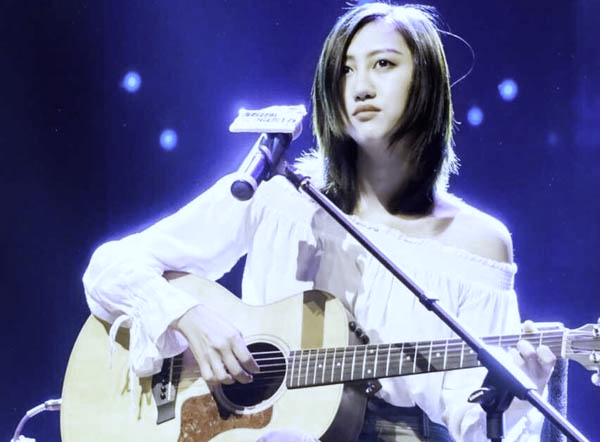

In [93]:
from PIL import Image
im = Image.open('cl2.jpg')
rgb2xyz = (
    0.412453, 0.357580, 0.180423, 0,
    0.212671, 0.715160, 0.072169, 0,
    0.019334, 0.119193, 0.950227, 0)
im.convert("RGB", rgb2xyz)


### 模式“RGB”转换为其他不同模式
* 模式“1”

模式“1”为二值图像，非黑即白。但是它每个像素用8个bit表示，0表示黑，255表示白。下面我们将lena图像转换为“1”图像。

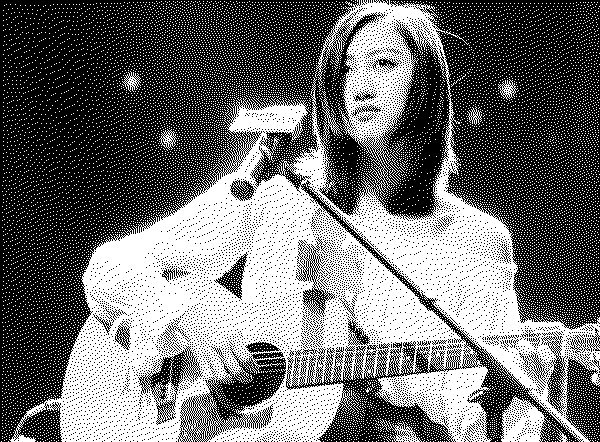

In [107]:
im.convert("1")

* 模式“L”

模式“L”为灰色图像，它的每个像素用8个bit表示，0表示黑，255表示白，其他数字表示不同的灰度。在PIL中，从模式“RGB”转换为“L”模式是按照下面的公式转换的：

L = R \* 299/1000 + G \* 587/1000+ B \* 114/1000

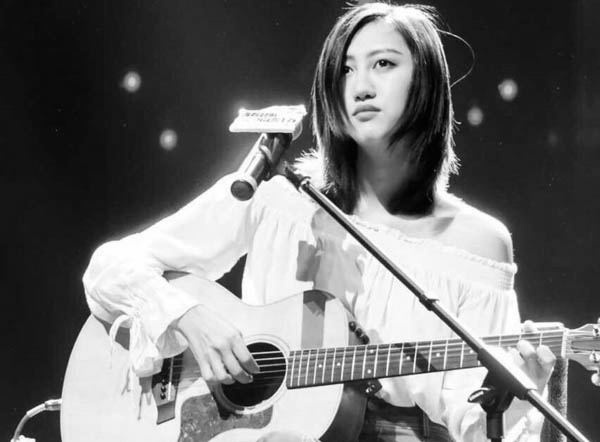

In [106]:
im.convert("L")

* 模式“P”

模式“P”为8位彩色图像，它的每个像素用8个bit表示，其对应的彩色值是按照调色板查询出来的。

下面我们使用默认的调色板将lena图像转换为“P”图像

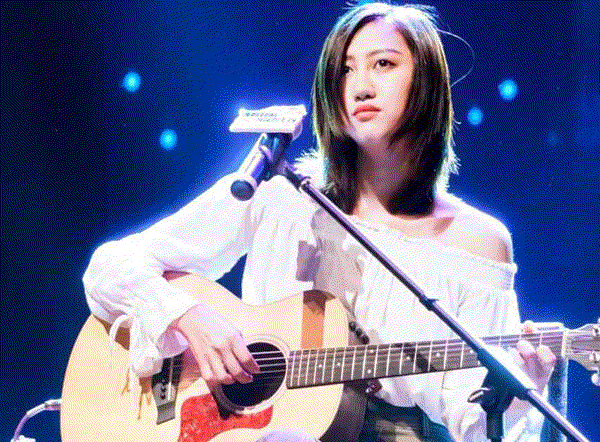

In [105]:
im.convert("P")

* 模式“RGBA”

模式“RGBA”为32位彩色图像，它的每个像素用32个bit表示，其中24bit表示红色、绿色和蓝色三个通道，另外8bit表示alpha通道，即透明通道。

下面我们将模式为“RGB”的lena图像转换为“RGBA”图像。

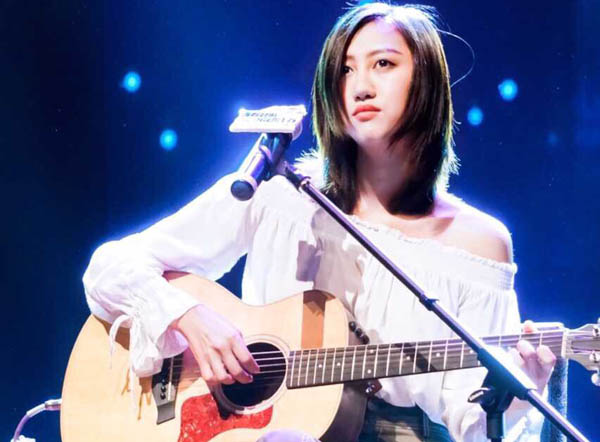

In [104]:
im.convert("RGBA")

* 模式“CMYK”

模式“CMYK”为32位彩色图像，它的每个像素用32个bit表示。模式“CMYK”就是印刷四分色模式，它是彩色印刷时采用的一种套色模式，利用色料的三原色混色原理，加上黑色油墨，共计四种颜色混合叠加，形成所谓“全彩印刷”。

四种标准颜色是：C：Cyan = 青色，又称为‘天蓝色’或是‘湛蓝’M：Magenta = 品红色，又称为‘洋红色’；Y：Yellow = 黄色；K：Key Plate(blacK) = 定位套版色（黑色）。

PIL中“RGB”转换为“CMYK”的公式如下：

C = 255 - R
M = 255 - G
Y = 255 - B
K = 0

由于该转换公式比较简单，转换后的图像颜色有些失真。


In [210]:
c=im.convert("CMYK")
c.show()

* 模式“YCbCr”

模式“YCbCr”为24位彩色图像，它的每个像素用24个bit表示。YCbCr其中Y是指亮度分量，Cb指蓝色色度分量，而Cr指红色色度分量。人的肉眼对视频的Y分量更敏感，因此在通过对色度分量进行子采样来减少色度分量后，肉眼将察觉不到的图像质量的变化。

模式“RGB”转换为“YCbCr”的公式如下：
```
Y= 0.257*R+0.504*G+0.098*B+16
Cb = -0.148*R-0.291*G+0.439*B+128
Cr = 0.439*R-0.368*G-0.071*B+128
```
下面我们将模式为“RGB”的lena图像转换为“YCbCr”图像。


In [209]:
v=im.convert("YCbCr")
v.show()

* 模式“I”

模式“I”为32位整型灰色图像，它的每个像素用32个bit表示，0表示黑，255表示白，(0,255)之间的数字表示不同的灰度。在PIL中，从模式“RGB”转换为“I”模式是按照下面的公式转换的：

`I = R * 299/1000 + G * 587/1000 + B * 114/1000`

下面我们将模式为“RGB”的lena图像转换为“I”图像。


In [208]:
i=im.convert("I")
i.show()

* 模式“F”

模式“F”为32位浮点灰色图像，它的每个像素用32个bit表示，0表示黑，255表示白，(0,255)之间的数字表示不同的灰度。在PIL中，从模式“RGB”转换为“F”模式是按照下面的公式转换的：

F = R * 299/1000+ G * 587/1000 + B * 114/1000

下面我们将模式为“RGB”的lena图像转换为“F”图像。


In [207]:
f=im.convert("F")
f.show()

 `Image.copy`()

  复制此图像。如果要将内容粘贴到图像中，但仍保留原始内容，请使用此方法。

* 返回类型
   *  `Image`

 * 返回
   *  一个&nbsp;`Image`&nbsp;对象。


 `Image.crop`(_box=None_)

 返回此图像中的矩形区域。框是定义左、上、右和下像素坐标的四元组。见&nbsp;坐标系&nbsp;.

     注意：在Pillow3.4.0之前，这是一个懒惰的操作。

 * 参数
   *  **box**&nbsp;-- 裁剪矩形，作为（左、上、右、下）元组。

 * 返回类型
   *  `Image`

 * 返回
   *  一个&nbsp;`Image`&nbsp;对象。

 这将使用提供的坐标裁剪输入图像：

In [8]:
from PIL import Image

im = Image.open("cl2.jpg")

# The crop method from the Image module takes four coordinates as input.
# The right can also be represented as (left+width)
# and lower can be represented as (upper+height).
(left, upper, right, lower) = (300, 0, 450, 200)

# Here the image "im" is cropped and assigned to new variable im_crop
im_crop = im.crop((left, upper, right, lower))


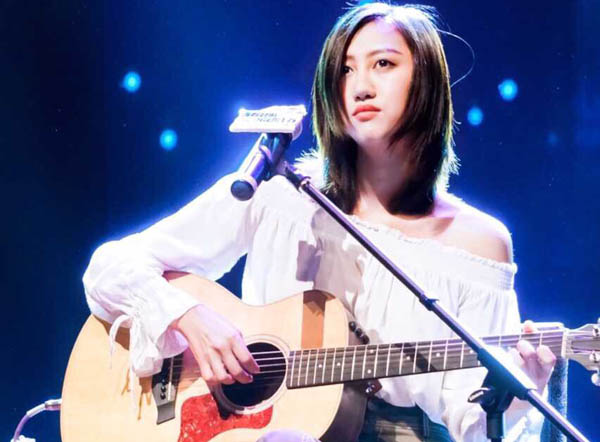

In [2]:
im

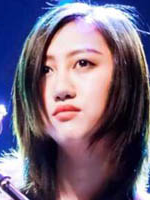

In [9]:
im_crop

 `Image.draft`(_mode_,&nbsp;_size_)

配置 Mapfile 加载程序，使其返回尽可能与给定模式和大小匹配的映像版本。例如，可以使用此方法在加载彩色JPEG时将其转换为灰度。

如果进行了任何更改，则返回一个带有&nbsp;`mode`&nbsp;和&nbsp;`box`&nbsp;原始图像的坐标在修改后的图像内。

请注意，此方法修改了&nbsp;`Image`&nbsp;物体就位。如果图像已加载，则此方法无效。

注意：此方法不适用于大多数图像。它目前只为JPEG和MPO图像实现*

* 参数
  *  **mode**&nbsp;需要的模式。
  *  **size**&nbsp;需要的尺寸


 `Image.filter`(_filter_)

 使用给定的筛选器筛选此图像。有关可用筛选器的列表，请参阅&nbsp;`ImageFilter`&nbsp;模块。

 * 参数
   *  **filter**&nbsp;-- 过滤内核。

 * 返回
   *  一个&nbsp;`Image`&nbsp;对象。

这将使用来自&nbsp;`ImageFilter`&nbsp;模块模糊一个图像：

In [187]:
from PIL import Image, ImageFilter

im = Image.open("cl2.jpg")

# Blur the input image using the filter ImageFilter.BLUR
im_blurred = im.filter(filter=ImageFilter.BLUR)


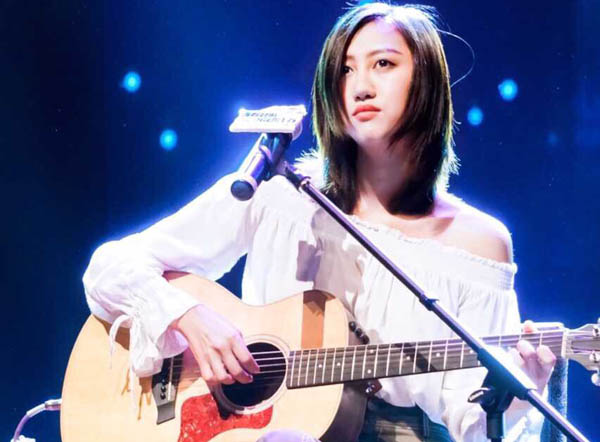

In [188]:
im

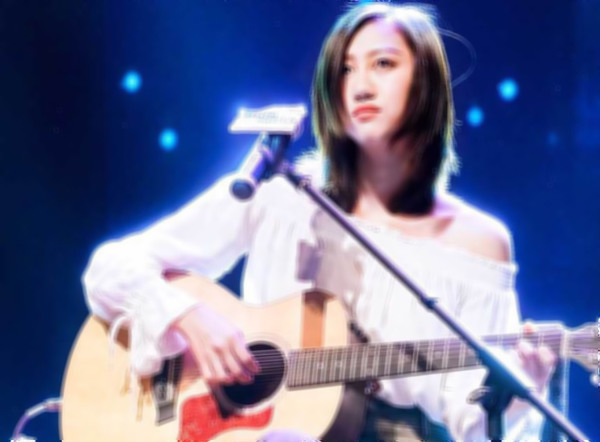

In [189]:
im_blurred

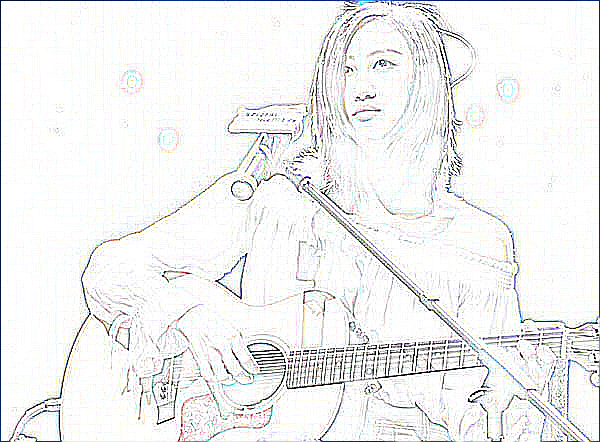

In [190]:
im.filter(filter=ImageFilter.CONTOUR)

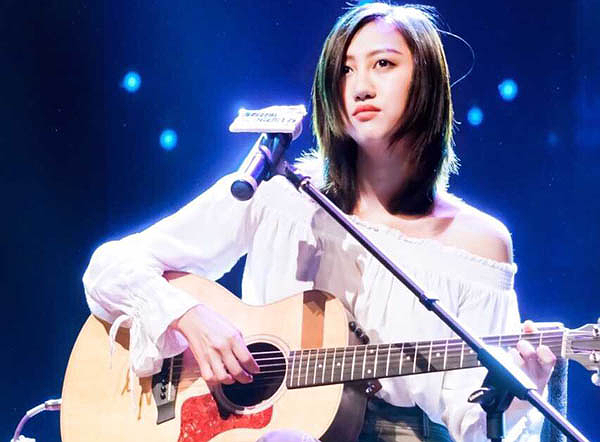

In [191]:
im.filter(filter=ImageFilter.DETAIL)

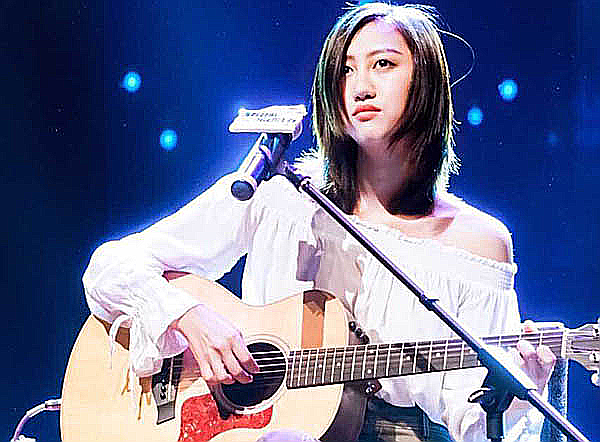

In [192]:
im.filter(filter=ImageFilter.EDGE_ENHANCE)

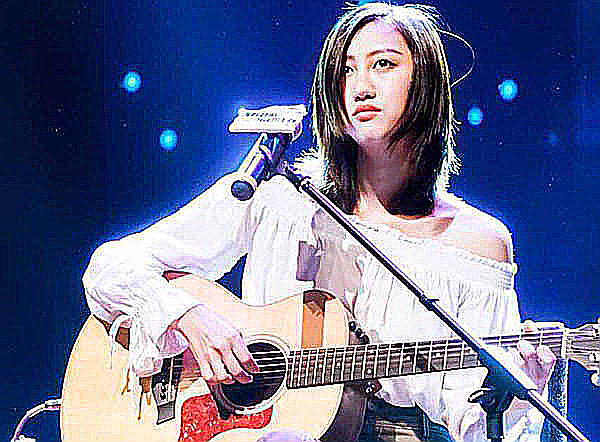

In [193]:
im.filter(filter=ImageFilter.EDGE_ENHANCE_MORE)

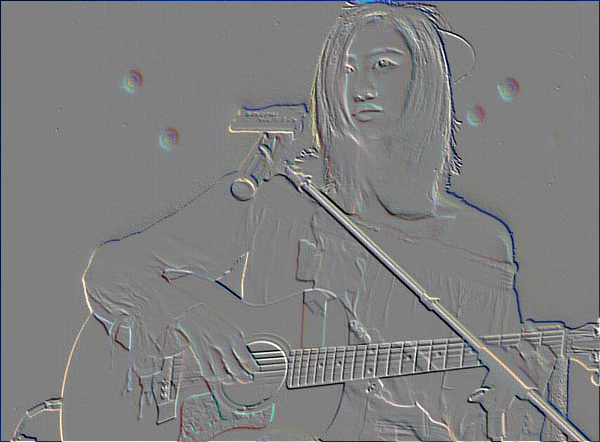

In [194]:
im.filter(filter=ImageFilter.EMBOSS)

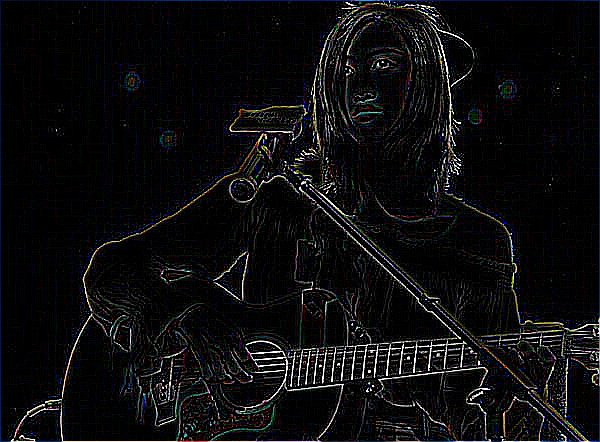

In [195]:
im.filter(filter=ImageFilter.FIND_EDGES)

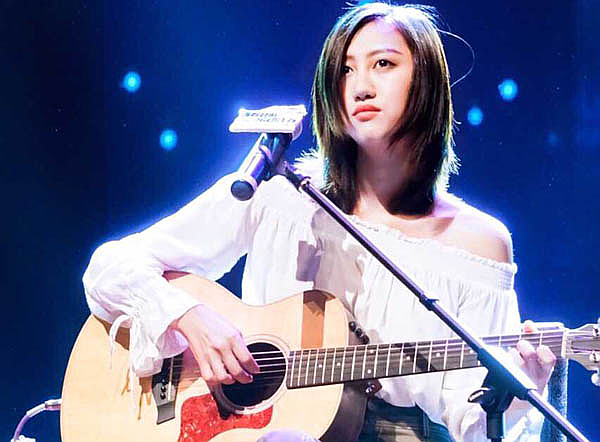

In [196]:
im.filter(filter=ImageFilter.SHARPEN)

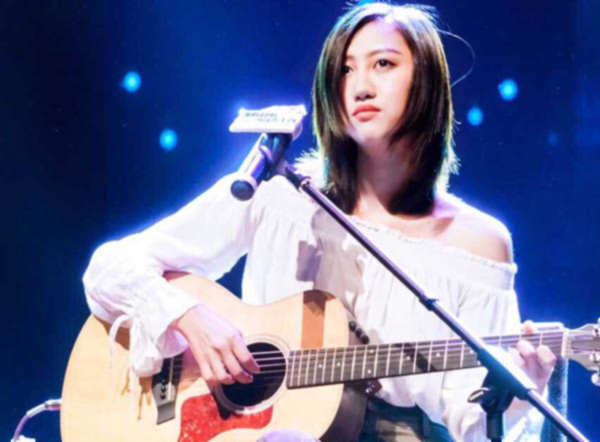

In [197]:
im.filter(filter=ImageFilter.SMOOTH)

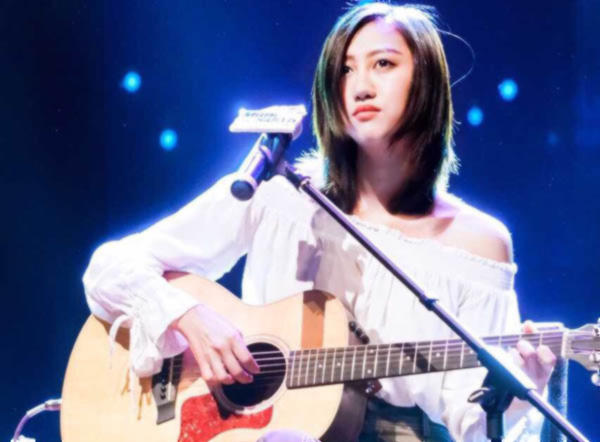

In [198]:
im.filter(filter=ImageFilter.SMOOTH_MORE)

 `Image.getbands`()

 返回一个包含此图像中每个带区的名称的元组。例如，&nbsp;**getbands**&nbsp;在RGB图像上返回（“R”、“G”、“B”）。

 * 返回
   *  包含带区名称的元组。

 * 返回类型
   *  tuple

这有助于获取输入图像的带区：

In [13]:
im.getbands()

('R', 'G', 'B')

 `Image.getbbox`()

 计算图像中非零区域的边界框。

 * 返回
   *  边界框作为定义左、上、右和下像素坐标的四元组返回。见&nbsp;坐标系&nbsp;. 如果图像完全为空，则此方法返回“无”。

这有助于获取输入图像的边界框坐标：

In [14]:
im.getbbox()
# Returns four coordinates in the format (left, upper, right, lower)


(0, 0, 600, 442)

 `Image.getcolors`(_maxcolors=256_)

 返回此图像中使用的颜色列表。

 * 参数
   *  **maxcolors**&nbsp;-- 最大颜色数。如果超过此数字，此方法将不返回任何值。默认限制为256色。

 * 返回
   *  （计数、像素）值的未排序列表。



In [204]:
im.getcolors(maxcolors=1000000)

 `Image.getdata`(_band=None_)

将此图像的内容作为包含像素值的序列对象返回。序列对象被展平，因此行1的值直接位于行0的值之后，依此类推。

注意，这个方法返回的sequence对象是一个内部PIL数据类型，它只支持特定的sequence操作。要将其转换为普通序列（例如用于打印），请使用**list（im.getdata（））**。

 * 参数
   *  **band**&nbsp;-- 返回哪个波段。默认值是返回所有带区。要返回单个波段，请传递索引值（例如0，从“rgb”图像中获取“r”波段）。

 * 返回
   *  类似序列的物体。

In [25]:
im.getdata()

 `Image.getextrema`()

 获取图像中每个波段的最小和最大像素值。

 * 返回
   *  对于单波段图像，包含最小和最大像素值的2元组。对于多波段图像，每个波段包含一个2元组的元组。

In [26]:
im.getextrema()

((0, 255), (0, 255), (0, 255))

 `Image.getpalette`()

 以列表形式返回图像调色板。

 * 返回
   *  如果图像没有调色板，则显示颜色值列表[R、G、B…]或无。

In [211]:
im.getpalette()

 `Image.getpixel`(_xy_)

 返回给定位置的像素值。

 * 参数
   *  **xy**&nbsp;-- 坐标，以（x，y）表示。见&nbsp;坐标系&nbsp;.

 * 返回
   *  像素值。如果图像是多层图像，则此方法返回元组。

In [212]:
im.getpixel((100,100))

(3, 16, 61)

 `Image.histogram`(_mask=None_,&nbsp;_extrema=None_)

 返回图像的直方图。柱状图以像素计数列表的形式返回，每个像素值对应一个源图像。如果图像有多个波段，则所有波段的柱状图都会连接起来（例如，“RGB”图像的柱状图包含768个值）。

该方法将二级图像（模式“1”）作为灰度（“L”）图像处理。

如果提供了遮罩，该方法将返回图像中遮罩图像非零部分的直方图。遮罩图像必须与图像具有相同的大小，并且是双层图像（模式“1”）或灰度图像（“L”）。

 * 参数
   *  **mask**&nbsp;-- 一个可选的面具。
   *  **extrema**&nbsp;-- 手动指定的极值的可选元组。

 * 返回
   *  包含像素计数的列表。

In [30]:
len(im.histogram())

768

 `Image.offset`(_xoffset_,&nbsp;_yoffset=None_)



 `Image.paste`(_im_,&nbsp;_box=None_,&nbsp;_mask=None_)

将另一个图像粘贴到此图像中。box参数要么是给出左上角的2元组，要么是定义左、上、右和下像素坐标的4元组，要么是无（与（0，0）相同）。见&nbsp;坐标系&nbsp;. 如果给定4元组，则粘贴图像的大小必须与区域的大小匹配。

如果模式不匹配，则粘贴的图像将转换为此图像的模式（请参见&nbsp;`convert()`&nbsp;详细方法）。

源可以是包含像素值的整数或元组，而不是图像。然后，该方法用给定的颜色填充该区域。创建RGB图像时，还可以使用ImageColor模块支持的颜色字符串。

如果给定了遮罩，则此方法仅更新遮罩指示的区域。您可以使用“1”、“l”或“rgba”图像（在后一种情况下，alpha带用作遮罩）。如果遮罩为255，则按原样复制给定图像。如果遮罩为0，则保留当前值。中间值将两个图像混合在一起，包括它们的alpha通道（如果有的话）。

见&nbsp;`alpha_composite()`&nbsp;如果你想结合图像的阿尔法通道。

 * 参数
   *  **im**&nbsp;-- 源图像或像素值（整数或元组）。
   *  **box**&nbsp;-- 一个可选的4元组，给出要粘贴到的区域。如果使用2元组，则将其视为左上角。如果省略或没有，则源将粘贴到左上角。如果将图像作为第二个参数提供，而没有第三个参数，则框默认为（0，0），第二个参数将解释为遮罩图像。
   *  **mask**&nbsp;-- 可选的遮罩图像。

In [31]:
im.paste(im_crop)

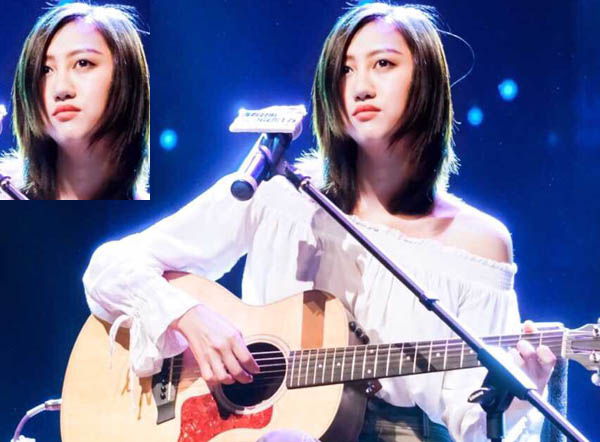

In [32]:
im

 `Image.point`(_lut_,&nbsp;_mode=None_)

 通过查找表或函数映射此图像。

 * 参数
   *  **lut**&nbsp;-- 一个查找表，包含图像中每个波段的256个（或65536个，如果self.mode==“i”和mode==“l”）值。可以改用函数，它应采用单个参数。对每个可能的像素值调用一次函数，结果表将应用于图像的所有带区。
   *  **mode**&nbsp;-- 输出模式（默认与输入相同）。在当前版本中，只有当源图像具有模式“L”或“P”，并且输出具有模式“1”或源图像模式为“I”，并且输出模式为“L”时，才能使用此选项。

 * 返回
   *  一个&nbsp;`Image`&nbsp;对象。

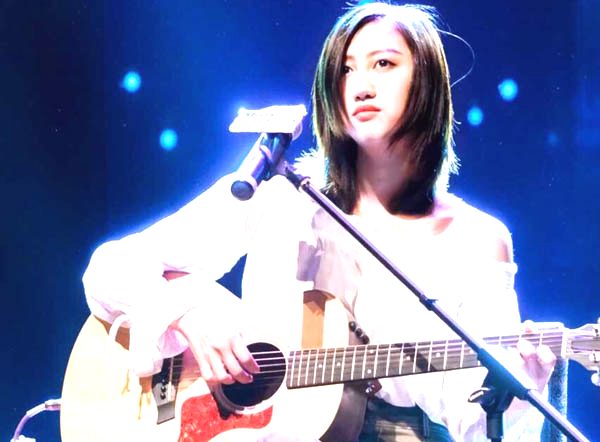

In [213]:
im.point(lambda i: i * 1.2 + 10)

 `Image.putalpha`(_alpha_)

 添加或替换此图像中的alpha层。如果图像没有alpha层，它将转换为“la”或“rgba”。新层必须是“l”或“1”。

 * 参数
   *  **alpha**&nbsp;-- 新的alpha层。这可以是与此图像大小相同的“l”或“1”图像，也可以是整数或其他颜色值。

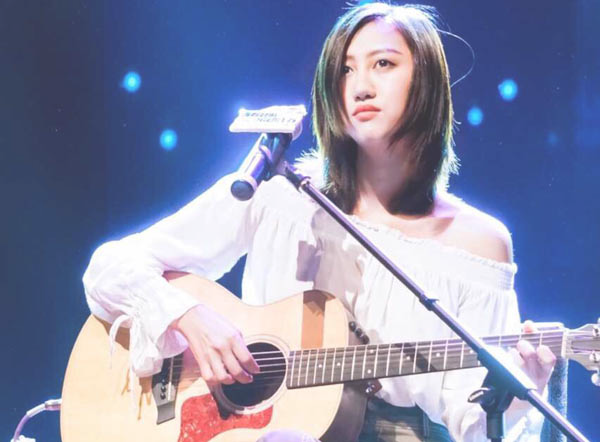

In [231]:
imc=im.copy()
imc.putalpha(200)
imc

 `Image.putdata`(_data_,&nbsp;_scale=1.0_,&nbsp;_offset=0.0_)

 将像素数据复制到此图像。此方法将数据从序列对象复制到图像中，从左上角（0，0）开始，一直复制到图像或序列结束。比例和偏移值用于调整序列值： 像素=值*比例+偏移.

 * 参数
   *  **data**&nbsp;-- 序列对象。
   *  **scale**&nbsp;-- 可选的比例值。默认值为1.0。
   *  **offset**&nbsp;-- 可选的偏移值。默认值为0.0。

 `Image.putpalette`(_data_,&nbsp;_rawmode='RGB'_)

 将调色板附加到此图像。图像必须是“p”、“p a”、“l”或“la”图像，调色板序列必须包含768个整数值，其中每组三个值代表对应像素索引的红色、绿色和蓝色值。您可以使用8位字符串代替整数序列。

 * 参数
   *  **data**&nbsp;-- 调色板序列（列表或字符串）。
   *  **rawmode**&nbsp;-- 调色板的原始模式。

 `Image.putpixel`(_xy_,&nbsp;_value_)

修改给定位置的像素。对于单波段图像，颜色以单个数值表示，对于多波段图像，颜色以元组表示。除此之外，p图像还接受rgb和rgba元组。

请注意，此方法相对较慢。要进行更广泛的更改，请使用&nbsp;`paste()`&nbsp;或&nbsp;`ImageDraw`&nbsp;模块代替。

参见：

     *  `paste()`
     *  `putdata()`
     *  `ImageDraw`

* 参数
   *  **xy**&nbsp;-- 像素坐标，表示为（x，y）。见&nbsp;坐标系&nbsp;.
   *  **value**&nbsp;-- 像素值。

 `Image.quantize`(_colors=256_,&nbsp;_method=None_,&nbsp;_kmeans=0_,&nbsp;_palette=None_,&nbsp;_dither=1_)

 使用指定的颜色数将图像转换为“p”模式。

 * 参数
   *  **colors**&nbsp;-- 所需的颜色数，&lt;=256
   *  **method**&nbsp;-- 0=中值切割1=最大覆盖2=快速八叉树3=libImageQuant
   *  **kmeans**&nbsp;-- 整数
   *  **palette**&nbsp;-- 量化到给定的调色板&nbsp;`PIL.Image.Image`&nbsp;.
   *  **dither**&nbsp;-- 抖动方法，从模式“RGB”转换为“P”或从“RGB”或“L”转换为“1”时使用。可用方法为无或Floydsteinberg（默认）。默认值：1（传统设置）

 * 返回
   *  新形象

 `Image.resize`(_size_,&nbsp;_resample=3_,&nbsp;_box=None_,&nbsp;_reducing_gap=None_)

 返回此图像的已调整大小的副本。

 * 参数
   *  **size**&nbsp;-- 以像素为单位的请求大小，作为2元组：（宽度、高度）。
   *  **resample**&nbsp;-- 可选的重新采样过滤器。这可能是&nbsp;`PIL.Image.NEAREST`&nbsp;，&nbsp;`PIL.Image.BOX`&nbsp;，&nbsp;`PIL.Image.BILINEAR`&nbsp;，&nbsp;`PIL.Image.HAMMING`&nbsp;，&nbsp;`PIL.Image.BICUBIC`&nbsp;或&nbsp;`PIL.Image.LANCZOS`&nbsp;. 默认筛选器为&nbsp;`PIL.Image.BICUBIC`&nbsp;. 如果图像具有模式“1”或“P”，则始终设置为&nbsp;`PIL.Image.NEAREST`&nbsp;. 见：&nbsp;过滤器&nbsp;.
   *  **box**&nbsp;-- 一个可选的4元组浮点数，提供要缩放的源图像区域。值必须在（0，0，宽度，高度）矩形内。如果省略或没有，则使用整个源。
   *  **reducing_gap**&nbsp;-- 通过两步调整图像大小来应用优化。首先，使用&nbsp;`reduce()`&nbsp;. 其次，使用常规重采样调整大小。最后一步改变大小不小于&nbsp;`reducing_gap`&nbsp;时代。&nbsp;`reducing_gap`&nbsp;可以是“无”（不执行第一步）或应大于1.0。更大的&nbsp;`reducing_gap`&nbsp;，结果越接近公平再采样。较小的&nbsp;`reducing_gap`&nbsp;，调整大小的速度越快。与&nbsp;`reducing_gap`&nbsp;大于或等于3.0时，在大多数情况下，结果与公平重采样没有区别。默认值为“无”（无优化）。

 * 返回
   *  一个&nbsp;`Image`&nbsp;对象。

 这将调整给定图像的大小&nbsp;`(width, height)`&nbsp;到&nbsp;`(width/2, height/2)`&nbsp;：

In [40]:
from PIL import Image

im = Image.open("cl2.jpg")

# Provide the target width and height of the image
(width, height) = (im.width // 2, im.height // 2)
im_resized = im.resize((width, height))


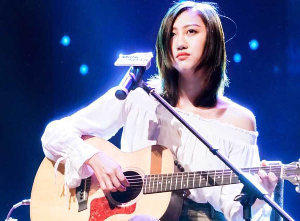

In [41]:
im_resized

 `Image.remap_palette`(_dest_map_,&nbsp;_source_palette=None_)

 重写图像以重新排序调色板。

 * 参数
   *  **dest_map**&nbsp;-- 原始调色板中的索引列表。例如 [1,0] 将交换一个两项调色板，list（range（256））是标识转换。
   *  **source_palette**&nbsp;-- 字节或无。

 * 返回
   *  一个&nbsp;`Image`&nbsp;对象。

 `Image.rotate`(_angle_,&nbsp;_resample=0_,&nbsp;_expand=0_,&nbsp;_center=None_,&nbsp;_translate=None_,&nbsp;_fillcolor=None_)

 返回此图像的旋转副本。此方法返回此图像的副本，围绕其中心逆时针旋转给定的度数。

 * 参数
   *  **angle**&nbsp;-- 逆时针角度。
   *  **resample**&nbsp;-- 可选的重新采样过滤器。这可能是&nbsp;`PIL.Image.NEAREST`&nbsp;（使用最近的邻居）&nbsp;`PIL.Image.BILINEAR`&nbsp;（2x2环境中的线性插值），或&nbsp;`PIL.Image.BICUBIC`&nbsp;（4x4环境中的三次样条插值）。如果省略，或者图像具有模式“1”或“P”，则设置为&nbsp;`PIL.Image.NEAREST`&nbsp;. 见&nbsp;过滤器&nbsp;.
   *  **expand**&nbsp;-- 可选扩展标志。如果为真，则展开输出图像，使其足够大以容纳整个旋转图像。如果为false或省略，则使输出图像与输入图像大小相同。请注意，展开标志假定围绕中心旋转，不进行平移。
   *  **center**&nbsp;-- 可选旋转中心（2元组）。原点是左上角。默认为图像的中心。
   *  **translate**&nbsp;-- 可选的后旋转翻译（2元组）。
   *  **fillcolor**&nbsp;-- 旋转图像外部区域的可选颜色。

 * 返回
   *  一个&nbsp;`Image`&nbsp;对象。

 这将使输入图像旋转&nbsp;`theta`&nbsp;逆时针度数：

In [240]:
from PIL import Image

im = Image.open("cl2.jpg")

# Rotate the image by 60 degrees counter clockwise
theta = 60
# Angle is in degrees counter clockwise
im_rotated = im.rotate(angle=theta)


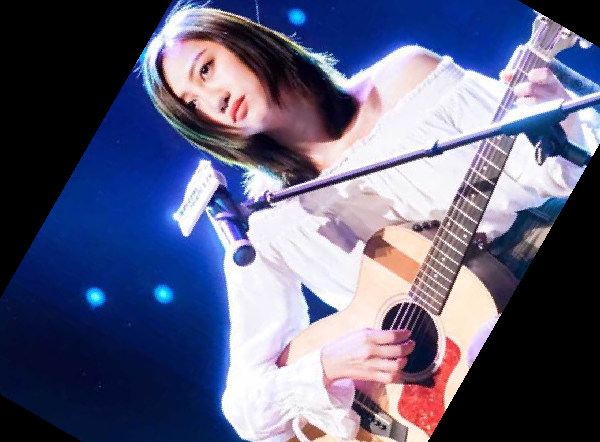

In [43]:
im_rotated

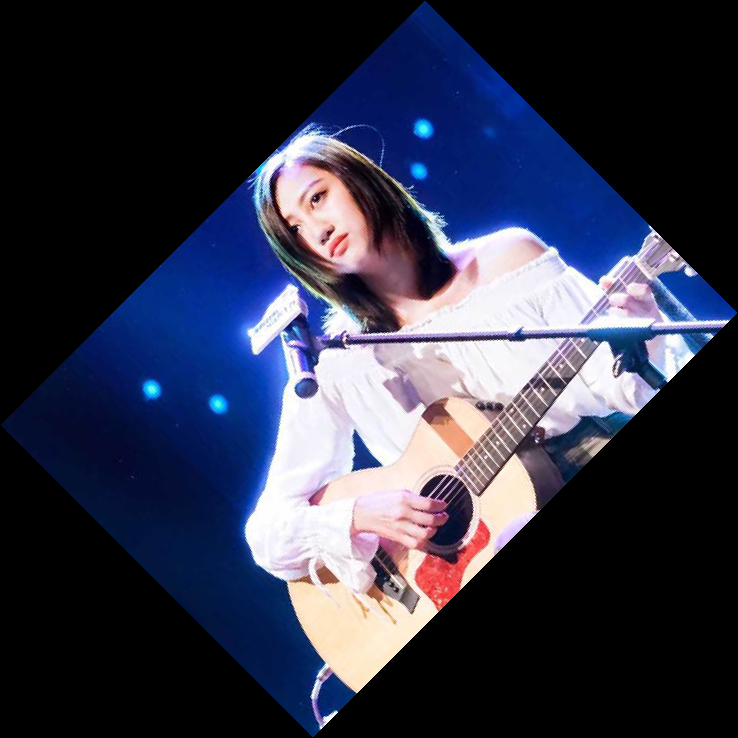

In [44]:
im.rotate(angle=45,expand=1)

 `Image.save`(_fp_,&nbsp;_format=None_,&nbsp;_**params_)

 在给定文件名下保存此图像。如果未指定格式，则可以从文件扩展名确定要使用的格式（如果可能）。

     关键字选项可用于向编写器提供附加说明。如果一个作家不认识一个选项，它就会被默默地忽略。可用选项在&nbsp;image format documentation&nbsp;对于每个作家。

     可以使用文件对象而不是文件名。在这种情况下，必须始终指定格式。文件对象必须实现&nbsp;`seek`，&nbsp;`tell`&nbsp;和&nbsp;`write`&nbsp;方法，并以二进制模式打开。

 * 参数
   *  **fp**&nbsp;-- 文件名（字符串）、pathlib.path对象或文件对象。
   *  **format**&nbsp;-- 可选格式替代。如果省略，则使用的格式由文件扩展名决定。如果使用的是文件对象而不是文件名，则应始终使用此参数。
   *  **params**&nbsp;-- 图像编写器的额外参数。

 * 返回
   *  没有

 * 引发
   *  **ValueError**&nbsp;-- 如果无法从文件名确定输出格式。使用“格式”选项解决此问题。
   *  **IOError**&nbsp;-- 如果无法写入文件。文件可能已创建，并且可能包含部分数据。

 `Image.seek`(_frame_)

 查找此序列文件中的给定帧。如果在序列结尾之外查找，该方法将引发&nbsp;**EOFError**&nbsp;例外。打开序列文件时，库自动查找第0帧。

见&nbsp;`tell()`&nbsp;.

 * 参数
   *  **frame**&nbsp;-- 帧编号，从0开始。

 * 引发
   *  **EOFError**&nbsp;-- 如果调用试图在序列结束后查找。

 `Image.show`(_title=None_,&nbsp;_command=None_)

 显示此图像。此方法主要用于调试目的。

图像首先保存到临时文件中。默认情况下，它将采用PNG格式。

在Unix上，然后使用&nbsp;**显示**&nbsp;，&nbsp;**eog**&nbsp;或&nbsp;**xv**&nbsp;实用程序，取决于可以找到哪一个。

在macOS上，图像是用本机预览应用程序打开的。

在Windows上，使用标准PNG显示实用程序打开图像。

 * 参数
   *  **title**&nbsp;-- 在可能的情况下，用于图像窗口的可选标题。
   *  **command**&nbsp;-- 用于显示图像的命令

 `Image.split`()

 将此图像拆分为单独的带区。此方法从图像返回单个图像带的元组。例如，分割一个“RGB”图像将创建三个新图像，每个新图像包含一个原始带区（红色、绿色、蓝色）的副本。

 如果你只需要一个波段，&nbsp;`getchannel()`&nbsp;方法更方便快捷。

 * 返回
   *  包含波段的元组。

In [46]:
R,G,B = im.split()

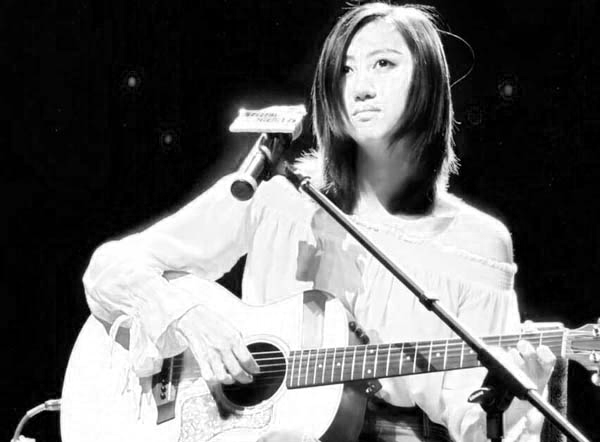

In [47]:
R

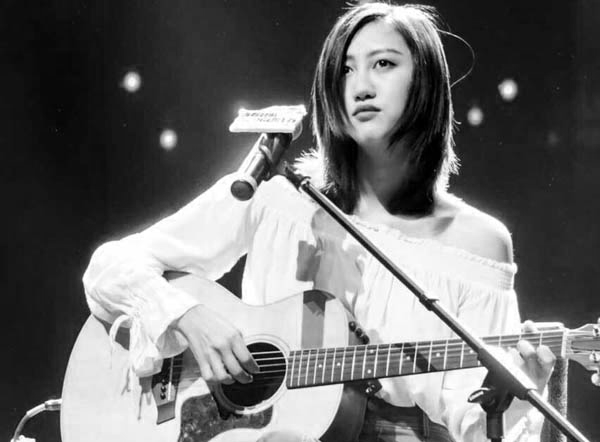

In [48]:
G

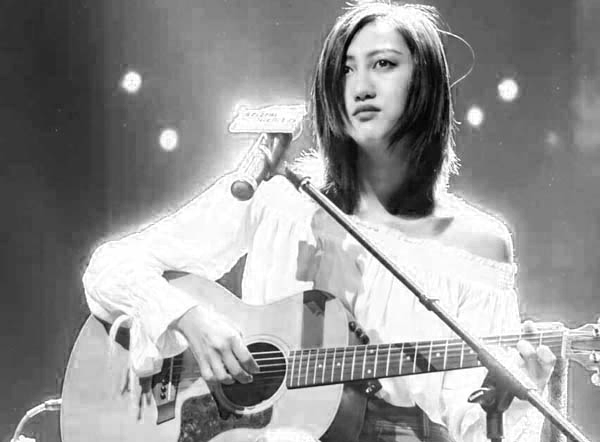

In [49]:
B

 `Image.getchannel`(_channel_)

 返回包含源图像的单个通道的图像。

 * 参数
   *  **channel**&nbsp;-- 返回哪个通道。可以是索引（“rgb”的“r”通道为0）或通道名称（“rgb a”的alpha通道为a”）。

 * 返回
   *  处于“L”模式的图像。

4.3.0 新版功能.

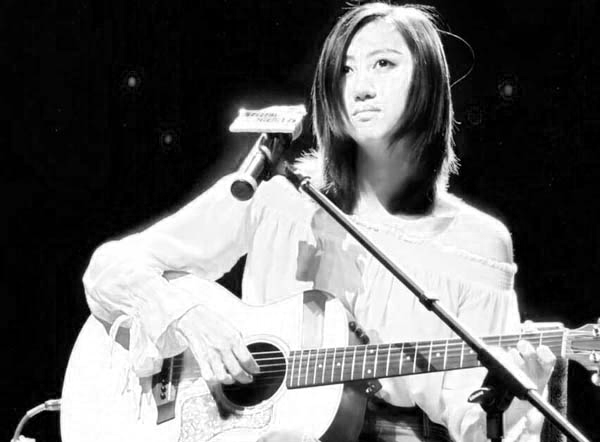

In [232]:
im.getchannel('R')

 `Image.tell`()

 返回当前帧号。见&nbsp;`seek()`&nbsp;.

 * 返回
   *  帧编号，从0开始。

 `Image.thumbnail`(_size_,&nbsp;_resample=3_,&nbsp;_reducing_gap=2.0_)

 将此图像制作成缩略图。此方法修改图像以包含不大于给定大小的自身缩略图版本。此方法计算适当的缩略图大小以保留图像的方面，调用&nbsp;`draft()`&nbsp;方法来配置文件读取器（如果适用），并最终调整图像的大小。

请注意，此函数修改&nbsp;`Image`&nbsp;对象就位。如果还需要使用全分辨率图像，请将此方法应用于&nbsp;`copy()`&nbsp;原始图像的。

 * 参数
   *  **size**&nbsp;-- 请求的大小。
   *  **resample**&nbsp;-- 可选的重新采样过滤器。这可能是&nbsp;`PIL.Image.NEAREST`&nbsp;，&nbsp;`PIL.Image.BILINEAR`，&nbsp;`PIL.Image.BICUBIC`&nbsp;或&nbsp;`PIL.Image.LANCZOS`&nbsp;. 如果省略，则默认为&nbsp;`PIL.Image.BICUBIC`&nbsp;. 是&nbsp;`PIL.Image.NEAREST`&nbsp;2.5.0版之前）。
   *  **reducing_gap**&nbsp;-- 通过两步调整图像大小来应用优化。首先，使用&nbsp;`reduce()`&nbsp;或&nbsp;`draft()`&nbsp;对于JPEG图像。其次，使用常规重采样调整大小。最后一步改变大小不小于&nbsp;`reducing_gap`时代。&nbsp;`reducing_gap`&nbsp;可以是“无”（不执行第一步）或应大于1.0。更大的&nbsp;`reducing_gap`&nbsp;，结果越接近公平再采样。较小的&nbsp;`reducing_gap`&nbsp;，调整大小的速度越快。与&nbsp;`reducing_gap`大于或等于3.0时，在大多数情况下，结果与公平重采样没有区别。默认值为2.0（非常接近公平重采样，但在许多情况下仍然更快）。

 * 返回
   *  没有

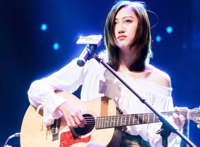

In [241]:
imc=im.copy()
imc.thumbnail((200,200))
imc

 `Image.tobitmap`(_name='image'_)

 返回转换为x11位图的图像。

注解

此方法仅适用于模式“1”图像。

 * 参数
   *  **name**&nbsp;-- 用于位图变量的名称前缀。

 * 返回
   *  包含x11位图的字符串。

 * 引发
   *  **ValueError**&nbsp;-- 如果模式不是“1”

 `Image.tobytes`(_encoder_name='raw'_,&nbsp;_*args_)

 以字节对象的形式返回图像。

警告

此方法从内部存储器返回原始图像数据。对于压缩图像数据（如PNG、JPEG），请使用&nbsp;`save()`&nbsp;，内存中的数据带有一个bytesio参数。

 * 参数
   *  **encoder_name**&nbsp;-- 使用什么编码器。默认使用标准的“原始”编码器。
   *  **args**&nbsp;-- 编码器的额外参数。

 * 返回类型
   *  A bytes object.

 `Image.tostring`(_*args_,&nbsp;_**kw_)


 `Image.transform`(_size_,&nbsp;_method_,&nbsp;_data=None_,&nbsp;_resample=0_,&nbsp;_fill=1_,&nbsp;_fillcolor=None_)

 转换此图像。此方法创建具有给定大小和与原始图像相同模式的新图像，并使用给定的转换将数据复制到新图像。

 * 参数
   *  **size**&nbsp;-- 输出大小。
   *  **method**&nbsp;-- 转换方法。这是其中之一&nbsp;`PIL.Image.EXTENT`&nbsp;（切出矩形分区）&nbsp;`PIL.Image.AFFINE`&nbsp;（仿射变换）&nbsp;`PIL.Image.PERSPECTIVE`&nbsp;（透视变换）&nbsp;`PIL.Image.QUAD`&nbsp;（将四边形映射到矩形），或&nbsp;`PIL.Image.MESH`&nbsp;（在一个操作中映射多个源四边形）。也可能是&nbsp;`ImageTransformHandler`&nbsp;object：：类示例（Image.ImageTransformHandler）：def transform（size，method，data，resample，fill=1）：#返回结果它也可以是具有&nbsp;`getdata()`&nbsp;返回提供新的&nbsp;**方法**&nbsp;和&nbsp;**data**&nbsp;values：：类示例（对象）：def getdata（self）：method=Image.EXTENT data=（0，0，100，100）返回方法，data
   *  **data**&nbsp;-- 转换方法的额外数据。
   *  **resample**&nbsp;-- 可选的重新采样过滤器。它可以是&nbsp;`PIL.Image.NEAREST`&nbsp;（使用最近的邻居）&nbsp;`PIL.Image.BILINEAR`&nbsp;（2x2环境中的线性插值），或&nbsp;`PIL.Image.BICUBIC`&nbsp;（4x4环境中的三次样条插值）。如果省略，或者图像具有模式“1”或“P”，则设置为&nbsp;`PIL.Image.NEAREST`&nbsp;.
   *  **fill**&nbsp;-- 如果&nbsp;**method**&nbsp;是一个&nbsp;`ImageTransformHandler`&nbsp;对象，这是传递给它的参数之一。否则，它是未使用的。
   *  **fillcolor**&nbsp;-- 输出图像中转换外部区域的可选填充颜色。

 * 返回
   *  一个&nbsp;`Image`&nbsp;对象。

 `Image.transpose`(_method_)

 转置图像（以90度的步幅翻转或旋转）

 * 参数
   *  **method**&nbsp;-- 什么之中的一个&nbsp;`PIL.Image.FLIP_LEFT_RIGHT`&nbsp;，&nbsp;`PIL.Image.FLIP_TOP_BOTTOM`&nbsp;，&nbsp;`PIL.Image.ROTATE_90`&nbsp;，&nbsp;`PIL.Image.ROTATE_180`&nbsp;，&nbsp;`PIL.Image.ROTATE_270`&nbsp;，&nbsp;`PIL.Image.TRANSPOSE`或&nbsp;`PIL.Image.TRANSVERSE`&nbsp;.

 * 返回
   *  返回此图像的翻转或旋转副本。

这将使用&nbsp;`Image.FLIP_LEFT_RIGHT`&nbsp;方法。

In [ ]:
from PIL import Image

im = Image.open("hopper.jpg")

# Flip the image from left to right
im_flipped = im.transpose(method=Image.FLIP_LEFT_RIGHT)
# To flip the image from top to bottom,
# use the method "Image.FLIP_TOP_BOTTOM"


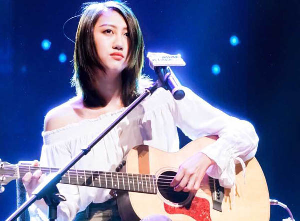

In [51]:
im_resized.transpose(Image.FLIP_LEFT_RIGHT)

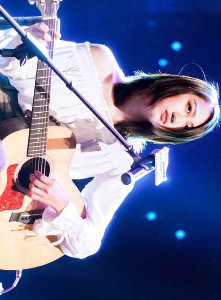

In [55]:
im_resized.transpose(Image.TRANSVERSE)

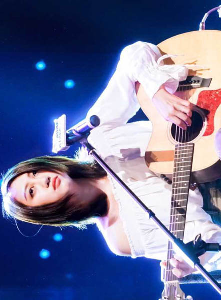

In [56]:
im_resized.transpose(Image.TRANSPOSE)

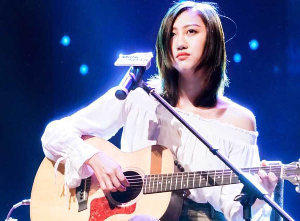

In [57]:
im_resized

 `Image.verify`()

 验证文件的内容。对于从文件读取的数据，此方法尝试确定文件是否已损坏，而不实际解码图像数据。如果此方法发现任何问题，则会引发适当的异常。如果使用此方法后需要加载图像，则必须重新打开图像文件。

 

`Image.fromstring`(_*args_,&nbsp;_**kw_)


 `Image.load`()

 为图像分配存储空间并加载像素数据。在正常情况下，不需要调用此方法，因为当首次访问打开的图像时，Image类会自动加载该图像。

如果与图像相关联的文件是通过 Pillow 打开的，那么此方法将关闭它。例外情况是如果图像有多个帧，在这种情况下，文件将保持打开状态以进行查找操作。见&nbsp;Pillow中的文件处理&nbsp;更多信息。

 * 返回
   *  图像访问对象。

 * 返回类型
   *  PixelAccess 等级&nbsp;or&nbsp;`PIL.PyAccess`

 `Image.close`()

 如果可能，关闭文件指针。

此操作将破坏图像核心并释放其内存。之后图像数据将无法使用。

此函数仅用于关闭未被&nbsp;`load()`&nbsp;方法。见&nbsp;Pillow中的文件处理&nbsp;更多信息。

 ## 属性

 的实例&nbsp;`Image`&nbsp;类具有以下属性：

 `PIL.Image.filename`
 源文件的文件名或路径。仅使用工厂功能创建的图像&nbsp;`open`&nbsp;具有文件名属性。如果输入是类似文件的对象，则将文件名属性设置为空字符串。

* 类型
   *  `string`

In [58]:
im.filename

'cl2.jpg'

In [59]:
im_resized.filename

AttributeError: 'Image' object has no attribute 'filename'

 `PIL.Image.format`
 源文件的文件格式。对于库本身创建的图像（通过工厂函数或通过对现有图像运行方法），此属性设置为&nbsp;`None`&nbsp;.

* 类型
   *  `string`&nbsp;or&nbsp;`None`

In [62]:
im.format

'JPEG'

 `PIL.Image.mode`
 图像模式。这是一个指定图像使用的像素格式的字符串。典型值为“1”、“l”、“rgb”或“cmyk”。请参见&nbsp;模式&nbsp;完整的列表。

* 类型
   *  `string`

In [63]:
im_resized.mode

'RGB'

 `PIL.Image.size`
 图像大小（像素）。大小以2元组（宽度、高度）表示。

* 类型
   *  `(width, height)`

In [64]:
im.size

(600, 442)

 `PIL.Image.width`
 图像宽度，以像素为单位。

* 类型
   *  `int`

In [65]:
im.width

600

 `PIL.Image.height`
 图像高度，以像素为单位。

* 类型
   *  `int`

In [66]:
im.height

442

 `PIL.Image.palette`
 调色板表（如有）。如果模式为“P”或“PA”，则这应该是&nbsp;`ImagePalette`&nbsp;班级。否则，应将其设置为&nbsp;`None`&nbsp;.

* 类型
   *  `ImagePalette`&nbsp;or&nbsp;`None`

In [67]:
im.palette

 `PIL.Image.info`
保存与图象有关的数据的字典。文件处理程序使用此字典传递从文件中读取的各种非图像信息。有关详细信息，请参阅各种文件处理程序的文档。

大多数方法在返回新图像时忽略字典；由于键没有标准化，因此方法不可能知道操作是否影响字典。如果以后需要这些信息，请保留对从open方法返回的信息字典的引用。

除非另有说明，否则本词典不影响保存文件。

 * 类型
   *  `dict`

In [68]:
im.info

{'exif': b"Exif\x00\x00MM\x00*\x00\x00\x00\x08\x00\x0c\x01\x00\x00\x03\x00\x00\x00\x01\x03U\x00\x00\x01\x01\x00\x03\x00\x00\x00\x01\x05\x00\x00\x00\x01\x02\x00\x03\x00\x00\x00\x03\x00\x00\x00\x9e\x01\x06\x00\x03\x00\x00\x00\x01\x00\x02\x00\x00\x01\x12\x00\x03\x00\x00\x00\x01\x00\x01\x00\x00\x01\x15\x00\x03\x00\x00\x00\x01\x00\x03\x00\x00\x01\x1a\x00\x05\x00\x00\x00\x01\x00\x00\x00\xa4\x01\x1b\x00\x05\x00\x00\x00\x01\x00\x00\x00\xac\x01(\x00\x03\x00\x00\x00\x01\x00\x02\x00\x00\x011\x00\x02\x00\x00\x00\x1c\x00\x00\x00\xb4\x012\x00\x02\x00\x00\x00\x14\x00\x00\x00\xd0\x87i\x00\x04\x00\x00\x00\x01\x00\x00\x00\xe4\x00\x00\x01@\x00\x08\x00\x08\x00\x08\x00\n\xfc\x80\x00\x00'\x10\x00\n\xfc\x80\x00\x00'\x10Adobe Photoshop CS5 Windows\x002017:01:01 13:36:17\x00\x00\x07\x90\x00\x00\x07\x00\x00\x00\x040221\x91\x01\x00\x07\x00\x00\x00\x04\x01\x02\x03\x00\xa0\x00\x00\x07\x00\x00\x00\x040100\xa0\x01\x00\x03\x00\x00\x00\x01\x00\x01\x00\x00\xa0\x02\x00\x04\x00\x00\x00\x01\x00\x00\x02X\xa0\x03\x00\x04\x0